# ICDAR 2013 dataset

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files

In [ ]:
files.upload()

Saving kaggle (1).json to kaggle (1).json


{'kaggle (1).json': b'{"username":"saumitraagrawal","key":"6acc51e4cb92a0c240f8044ff22be4a4"}'}

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
! kaggle datasets download -d animesh2099/icdar2013-test-set

Dataset URL: https://www.kaggle.com/datasets/animesh2099/icdar2013-test-set
License(s): unknown
100% 251M/251M [00:12<00:00, 26.5MB/s]
100% 251M/251M [00:12<00:00, 21.5MB/s]


In [ ]:
!unzip /content/icdar2013-test-set.zip

Archive:  /content/icdar2013-test-set.zip
  inflating: Challenge2_Test_Task12_Images/img_1.jpg  
  inflating: Challenge2_Test_Task12_Images/img_10.jpg  
  inflating: Challenge2_Test_Task12_Images/img_100.jpg  
  inflating: Challenge2_Test_Task12_Images/img_101.jpg  
  inflating: Challenge2_Test_Task12_Images/img_102.jpg  
  inflating: Challenge2_Test_Task12_Images/img_103.jpg  
  inflating: Challenge2_Test_Task12_Images/img_104.jpg  
  inflating: Challenge2_Test_Task12_Images/img_105.jpg  
  inflating: Challenge2_Test_Task12_Images/img_106.jpg  
  inflating: Challenge2_Test_Task12_Images/img_107.jpg  
  inflating: Challenge2_Test_Task12_Images/img_108.jpg  
  inflating: Challenge2_Test_Task12_Images/img_109.jpg  
  inflating: Challenge2_Test_Task12_Images/img_11.jpg  
  inflating: Challenge2_Test_Task12_Images/img_110.jpg  
  inflating: Challenge2_Test_Task12_Images/img_111.jpg  
  inflating: Challenge2_Test_Task12_Images/img_112.jpg  
  inflating: Challenge2_Test_Task12_Images/img_113

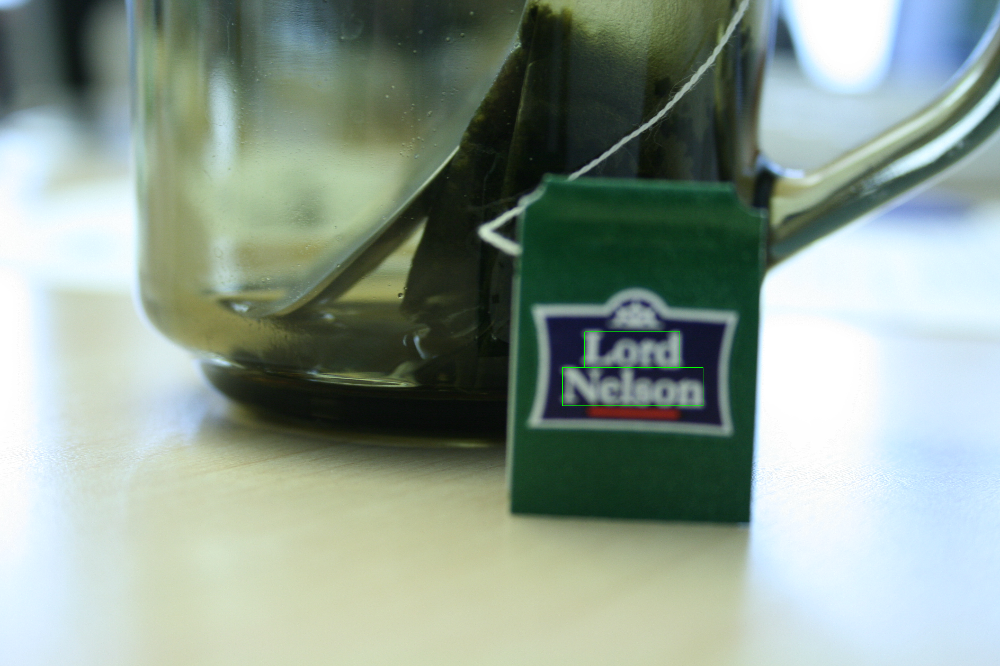

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def plot_bounding_boxes(image_path, boxes):
    image = cv2.imread(image_path)

    for xmin, ymin, xmax, ymax in boxes:
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)  # Draw rectangle

    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()



image_path = "/content/Challenge2_Test_Task12_Images/img_16.jpg"
gt_path = "/content/Challenge2_Test_Task1_GT (1)/gt_img_16.txt"

bounding_boxes = []
with open(gt_path) as file :
  for i in file :
    bounding_boxes.append([int(idx) for idx in i.split(",")[:-1]])

plot_bounding_boxes(image_path, bounding_boxes)

# CRAFT

In [11]:
!git clone https://github.com/SakuraRiven/CRAFT.git

Cloning into 'CRAFT'...
remote: Enumerating objects: 25, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 25 (delta 1), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (25/25), 54.29 KiB | 226.00 KiB/s, done.
Resolving deltas: 100% (1/1), done.


In [12]:
cd CRAFT

/content/CRAFT


In [13]:
import os
import shutil

# Create the directory structure
os.mkdir('pths')
os.chdir('pths')
os.mkdir('backbone')
os.mkdir('pretrain')
os.mkdir('ft')
os.chdir('..')


In [14]:

# Move the files
shutil.move('/content/drive/MyDrive/vgg16_bn-6c64b313.pth', 'pths/backbone/')
shutil.move('/content/drive/MyDrive/model_iter_50000.pth', 'pths/pretrain/')
shutil.move('/content/drive/MyDrive/model_iter_31600.pth', 'pths/ft/')

'pths/ft/model_iter_31600.pth'

In [15]:
# Install the required packages if the requirements file is found
if os.path.exists('CRAFT/requirements.txt'):
    !pip install -r CRAFT/requirements.txt
else:
    # Manually install known dependencies
    !pip install torch torchvision natsort opencv-python

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [16]:
# #changing the detect file
# import os
# import cv2
# import math
# import numpy as np
# import torch
# from torchvision import transforms
# from PIL import Image, ImageDraw
# from model import CRAFT
# from config import cfg
# import matplotlib.pyplot as plt
# from IPython.display import display

# def plot_boxes(img, boxes):
#     if boxes is None:
#         return img
#     draw = ImageDraw.Draw(img)
#     for box in boxes:
#         draw.polygon([box[0], box[1], box[2], box[3], box[4], box[5], box[6], box[7]], outline=(0, 255, 0))
#     return img

# def resize_img(img, long_side):
#     w, h = img.size
#     if long_side is not None:
#         if w > h:
#             resize_w = long_side
#             ratio = long_side / w
#             resize_h = h * ratio
#         else:
#             resize_h = long_side
#             ratio = long_side / h
#             resize_w = w * ratio
#     else:
#         resize_h, resize_w = h, w

#     final_h = int(resize_h) if resize_h % 32 == 0 else (int(resize_h / 32) + 1) * 32
#     final_w = int(resize_w) if resize_w % 32 == 0 else (int(resize_w / 32) + 1) * 32
#     img = img.resize((final_w, final_h), Image.BILINEAR)
#     ratio_h = final_h / h
#     ratio_w = final_w / w
#     return img, ratio_h, ratio_w

# def load_pil(img):
#     t = transforms.Compose([transforms.ToTensor(), transforms.Normalize(cfg.train.mean, cfg.train.std)])
#     return t(img).unsqueeze(0)

# def get_score(img, model, device):
#     with torch.no_grad():
#         region, affinity = model(load_pil(img).to(device))
#     return list(map(lambda x: x[0][0].cpu().numpy(), [region, affinity]))

# def restore_boxes(region, affinity, region_thresh, affinity_thresh, remove_thresh, ratio):
#     boxes = []
#     M = (region > region_thresh) + (affinity > affinity_thresh)
#     ret, markers = cv2.connectedComponents(np.uint8(M * 255))
#     for i in range(ret):
#         if i == 0:
#             continue
#         y, x = np.where(markers == i)
#         if len(y) < region.size * remove_thresh:
#             continue
#         cords = 2 * np.concatenate((x.reshape(-1, 1) / ratio[1], y.reshape(-1, 1) / ratio[0]), axis=1)
#         a = np.array([cords[:, 0].min(), cords[:, 1].min(), cords[:, 0].max(), cords[:, 1].min(), cords[:, 0].max(), cords[:, 1].max(), cords[:, 0].min(), cords[:, 1].max()])
#         boxes.append(a)
#     return boxes

# def detect_single_image(img, model, device, cfg):
#     img, ratio_h, ratio_w = resize_img(img, cfg.long_side)
#     region, affinity = get_score(img, model, device)
#     boxes = restore_boxes(region, affinity, cfg.region_thresh, cfg.affinity_thresh, cfg.remove_thresh, (ratio_h, ratio_w))
#     return boxes

# def detect_dataset(model, device, submit_path, cfg, th1=None, th2=None, th3=None):
#     img_files = os.listdir(cfg.dataset_test_path)
#     img_files = sorted([os.path.join(cfg.dataset_test_path, img_file) for img_file in img_files])

#     for i, img_file in enumerate(img_files):
#         print('evaluating {} image'.format(i), end='\r')
#         boxes = detect_single_image(Image.open(img_file), model, device, cfg)
#         seq = []
#         for box in boxes:
#             x_min = min(box[0], box[2], box[4], box[6])
#             x_max = max(box[0], box[2], box[4], box[6])
#             y_min = min(box[1], box[3], box[5], box[7])
#             y_max = max(box[1], box[3], box[5], box[7])
#             seq.append(','.join([str(int(v)) for v in [x_min, y_min, x_max, y_max]]) + '\n')
#         with open(os.path.join(submit_path, 'res_' + os.path.basename(img_file).replace('.jpg', '.txt')), 'w') as f:
#             f.writelines(seq)

# def print_boxes(boxes):
#     formatted_boxes = []
#     for box in boxes:
#         x_min = min(box[0], box[2], box[4], box[6])
#         x_max = max(box[0], box[2], box[4], box[6])
#         y_min = min(box[1], box[3], box[5], box[7])
#         y_max = max(box[1], box[3], box[5], box[7])
#         formatted_boxes.append([x_min, y_min, x_max, y_max])
#     print(formatted_boxes)

# if __name__ == '__main__':
#     img_path = '/content/Challenge2_Test_Task12_Images/img_1.jpg'

#     model_path = './pths/pretrain/model_iter_50000.pth'
#     device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#     model = CRAFT().to(device)

#     map_location = 'cuda:0' if torch.cuda.is_available() else 'cpu'
#     model.load_state_dict(torch.load(model_path, map_location=map_location))

#     model.eval()
#     img = Image.open(img_path)
#     boxes = detect_single_image(img, model, device, cfg.test)
#     img = plot_boxes(img, boxes)

#     # Display the image using IPython
#     display(img)

#     # Save the image
#     img.save('res.bmp')

#     # Print the coordinates of bounding boxes
#     print_boxes(boxes)


In [ ]:
!CUDA_VISIBLE_DEVICES=0 python /content/CRAFT/detect.py

<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1037x778 at 0x7ED607377C70>
[[317.58125, 179.70108695652175, 682.6916666666666, 266.3804347826087], [492.575, 276.95108695652175, 680.53125, 346.7173913043478], [321.90208333333334, 289.6358695652174, 486.09375, 348.83152173913044], [317.58125, 357.2880434782609, 397.51666666666665, 369.9728260869565]]


Checking the detect file on two sample images to get bounding box coordinates on img_1 and img_14 on ICDAR datasets

In [ ]:
# predicted bounding boxxes for img_14
# [[213, 37, 421, 72],
#  [116, 103, 375, 140],
#  [387, 103, 519, 138],
#  [19, 155, 168, 183],
#  [269, 154, 384, 183],
#  [397, 154, 456, 183],
#  [543, 155, 613, 183],
#  [181, 162, 221, 183],
#  [236, 162, 256, 181],
#  [471, 162, 535, 183],
#  [121, 206, 152, 233],
#  [165, 206, 328, 233],
#  [341, 206, 512, 233],
#  [339, 241, 352, 260],
#  [120, 262, 169, 277],
#  [177, 262, 243, 278],
#  [251, 262, 305, 278],
#  [345, 262, 429, 278],
#  [472, 262, 512, 278],
#  [313, 263, 339, 278],
#  [437, 263, 465, 277],
#  [273, 317, 359, 390],
#  [212, 394, 421, 417],
#  [237, 423, 313, 442],
#  [321, 423, 395, 437]]

In [ ]:
# predicted bounding boxes for img_1
# [[31, 40, 921, 216],
#  [274, 261, 668, 451],
#  [0, 560, 488, 1021],
#  [537, 707, 947, 840],
#  [517, 923, 837, 1024],
#  [517, 1069, 749, 1208],
#  [159, 1096, 475, 1232]]

In [17]:
cd /content/CRAFT

/content/CRAFT


# Sample data


In [18]:
cd /content

/content


In [19]:
!mkdir gt


In [20]:
cd gt

/content/gt


In [21]:
%%writefile gt_img_1.txt

38, 43, 920, 215, "Tiredness"
275, 264, 665, 450, "kills"
0, 699, 77, 830, "A"
128, 705, 483, 839, "short"
542, 710, 938, 841, "break"
87, 884, 457, 1021, "could"
517, 919, 831, 1024, "save"
166, 1095, 468, 1231, "###"
530, 1069, 743, 1206, "###"


Writing gt_img_1.txt


In [22]:
%%writefile gt_img_14.txt

214, 36, 419, 71, "WARNING"
116, 102, 321, 137, "Trespassing"
336, 109, 371, 131, "or"
386, 103, 516, 138, "causing"
20, 154, 168, 182, "nuisance"
181, 160, 221, 182, "on"
236, 161, 256, 182, "a"
270, 153, 381, 182, "school"
397, 154, 456, 182, "site"
469, 161, 529, 182, "can"
544, 155, 611, 183, "lead"
121, 206, 152, 233, "to"
166, 212, 185, 233, "a"
198, 205, 325, 233, "criminal"
341, 205, 510, 233, "conviction"
120, 262, 170, 277, "Under"
178, 262, 242, 277, "Section"
250, 263, 281, 277, "547"
288, 263, 304, 277, "of"
312, 263, 338, 277, "the"
346, 263, 429, 277, "Education"
436, 262, 463, 277, "Act"
470, 262, 511, 277, "1996"
211, 394, 270, 412, "Essex"
274, 394, 345, 416, "County"
350, 394, 420, 412, "Council"
238, 422, 312, 442, "###"
320, 422, 394, 437, "###"


Writing gt_img_14.txt


In [23]:
cd ..

/content


In [24]:
!mkdir result

In [25]:
cd result

/content/result


In [26]:
%%writefile res_img_1.txt
31, 40, 921, 216,
274, 261, 668, 451,
0, 560, 488, 1021,
537, 707, 947, 840,
517, 923, 837, 1024,
517, 1069, 749, 1208,
159, 1096, 475, 1232


Writing res_img_1.txt


In [27]:
%%writefile res_img_14.txt
213, 37, 421, 72,
116, 103, 375, 140,
387, 103, 519, 138,
19, 155, 168, 183,
269, 154, 384, 183,
397, 154, 456, 183,
543, 155, 613, 183,
181, 162, 221, 183,
236, 162, 256, 181,
471, 162, 535, 183,
121, 206, 152, 233,
165, 206, 328, 233,
341, 206, 512, 233,
339, 241, 352, 260,
120, 262, 169, 277,
177, 262, 243, 278,
251, 262, 305, 278,
345, 262, 429, 278,
472, 262, 512, 278,
313, 263, 339, 278,
437, 263, 465, 277,
273, 317, 359, 390,
212, 394, 421, 417,
237, 423, 313, 442,
321, 423, 395, 437


Writing res_img_14.txt


In [28]:
cd ..

/content


In [29]:
!zip gt/gt.zip gt/*

  adding: gt/gt_img_14.txt (deflated 50%)
  adding: gt/gt_img_1.txt (deflated 34%)


In [30]:
!zip result/result.zip result/*

  adding: result/res_img_14.txt (deflated 59%)
  adding: result/res_img_1.txt (deflated 41%)


# TedEval

In [31]:
!git clone https://github.com/clovaai/TedEval.git

Cloning into 'TedEval'...
remote: Enumerating objects: 92, done.
remote: Counting objects: 100% (40/40), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 92 (delta 21), reused 17 (delta 6), pack-reused 52
Receiving objects: 100% (92/92), 3.57 MiB | 11.71 MiB/s, done.
Resolving deltas: 100% (29/29), done.


In [32]:
!pip install Polygon3 bottle Pillow

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.2/90.2 kB 3.6 MB/s eta 0:00:00
  Created wheel for Polygon3: filename=Polygon3-3.0.9.1-cp310-cp310-linux_x86_64.whl size=117780 sha256=becfdb4bf4709ad8b5ace490d480e2a2091f6d8ea1e24ba185d40a9c7c72ee76
  Stored in directory: /root/.cache/pip/wheels/d8/b7/f6/b4e24f56a1cc9856dca98cc2fdc3915d7649b39b62f3dbca9e
Successfully built Polygon3


In [33]:
#!/usr/bin/env python3
#encoding: UTF-8
import json
import sys;sys.path.append('./')
import zipfile
import re
import sys
import os
import codecs
import importlib
from io import StringIO

In [34]:
def print_help():
    sys.stdout.write('Usage: python %s.py -g=<gtFile> -s=<submFile> [-o=<outputFolder> -p=<jsonParams>]' %sys.argv[0])
    sys.exit(2)

In [35]:
def load_zip_file_keys(file,fileNameRegExp=''):
    """
    Returns an array with the entries of the ZIP file that match with the regular expression.
    The key's are the names or the file or the capturing group definied in the fileNameRegExp
    """
    try:
        archive=zipfile.ZipFile(file, mode='r', allowZip64=True)
    except :
        raise Exception('Error loading the ZIP archive.')

    pairs = []

    for name in archive.namelist():
        addFile = True
        keyName = name
        if fileNameRegExp!="":
            m = re.match(fileNameRegExp,name)
            if m == None:
                addFile = False
            else:
                if len(m.groups())>0:
                    keyName = m.group(1)

        if addFile:
            pairs.append( keyName )

    return pairs

In [36]:
def load_zip_file(file,fileNameRegExp='',allEntries=False):
    """
    Returns an array with the contents (filtered by fileNameRegExp) of a ZIP file.
    The key's are the names or the file or the capturing group definied in the fileNameRegExp
    allEntries validates that all entries in the ZIP file pass the fileNameRegExp
    """
    try:
        archive=zipfile.ZipFile(file, mode='r', allowZip64=True)
    except :
        raise Exception('Error loading the ZIP archive')

    pairs = []
    for name in archive.namelist():
        addFile = True
        keyName = name
        # if fileNameRegExp!="":
            # m = re.match(fileNameRegExp,name)
            # if m == None:
            #     addFile = False
            # else:
            #     if len(m.groups())>0:
            #         keyName = m.group(1)
        keyName = name.replace('gt_', '').replace('res_', '').replace('.txt', '')

        if addFile:
            pairs.append( [ keyName , archive.read(name)] )
        else:
            if allEntries:
                raise Exception('ZIP entry not valid: %s' %name)

    return dict(pairs)

In [37]:
def decode_utf8(raw):
    """
    Returns a Unicode object on success, or None on failure
    """
    try:
        raw = codecs.decode(raw,'utf-8', 'replace')
        #extracts BOM if exists
        raw = raw.encode('utf8')
        if raw.startswith(codecs.BOM_UTF8):
            raw = raw.replace(codecs.BOM_UTF8, '', 1)
        return raw.decode('utf-8')
    except:
       return None

In [38]:
def validate_lines_in_file(fileName,file_contents,CRLF=True,LTRB=True,withTranscription=False,withConfidence=False,imWidth=0,imHeight=0):
    """
    This function validates that all lines of the file calling the Line validation function for each line
    """
    utf8File = decode_utf8(file_contents)
    if (utf8File is None) :
        raise Exception("The file %s is not UTF-8" %fileName)

    lines = utf8File.split( "\r\n" if CRLF else "\n" )
    for line in lines:
        line = line.replace("\r","").replace("\n","")
        # if(line != ""):
        #     try:
        #         validate_tl_line(line,LTRB,withTranscription,withConfidence,imWidth,imHeight)
        #     except Exception as e:
        #         raise Exception(("Line in sample not valid. Sample: %s Line: %s Error: %s" %(fileName,line,str(e))).encode('utf-8', 'replace'))



In [39]:
def validate_tl_line(line,LTRB=True,withTranscription=True,withConfidence=True,imWidth=0,imHeight=0):
    """
    Validate the format of the line. If the line is not valid an exception will be raised.
    If maxWidth and maxHeight are specified, all points must be inside the imgage bounds.
    Posible values are:
    LTRB=True: xmin,ymin,xmax,ymax[,confidence][,transcription]
    LTRB=False: x1,y1,x2,y2,x3,y3,x4,y4[,confidence][,transcription]
    """
    get_tl_line_values(line,LTRB,withTranscription,withConfidence,imWidth,imHeight)


In [40]:
def get_tl_line_values(line,LTRB=True,withTranscription=False,withConfidence=False,imWidth=0,imHeight=0):
    """
    Validate the format of the line. If the line is not valid an exception will be raised.
    If maxWidth and maxHeight are specified, all points must be inside the imgage bounds.
    Posible values are:
    LTRB=True: xmin,ymin,xmax,ymax[,confidence][,transcription]
    LTRB=False: x1,y1,x2,y2,x3,y3,x4,y4[,confidence][,transcription]
    Returns values from a textline. Points , [Confidences], [Transcriptions]
    """
    confidence = 0.0
    transcription = "";
    points = []

    numPoints = 4;

    if LTRB:

        numPoints = 4;

        if withTranscription and withConfidence:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-1].?[0-9]*)\s*,(.*)$',line)
            if m == None :
                m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-1].?[0-9]*)\s*,(.*)$',line)
                raise Exception("Format incorrect. Should be: xmin,ymin,xmax,ymax,confidence,transcription")
        elif withConfidence:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-1].?[0-9]*)\s*$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: xmin,ymin,xmax,ymax,confidence")
        elif withTranscription:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-9]+)\s*,(.*)$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: xmin,ymin,xmax,ymax,transcription")
        else:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-9]+)\s*,\s*([0-9]+)\s*,?\s*$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: xmin,ymin,xmax,ymax")

        xmin = int(m.group(1))
        ymin = int(m.group(2))
        xmax = int(m.group(3))
        ymax = int(m.group(4))
        if(xmax<xmin):
                raise Exception("Xmax value (%s) not valid (Xmax < Xmin)." %(xmax))
        if(ymax<ymin):
                raise Exception("Ymax value (%s)  not valid (Ymax < Ymin)." %(ymax))

        points = [ float(m.group(i)) for i in range(1, (numPoints+1) ) ]

        if (imWidth>0 and imHeight>0):
            validate_point_inside_bounds(xmin,ymin,imWidth,imHeight);
            validate_point_inside_bounds(xmax,ymax,imWidth,imHeight);

    else:

        numPoints = 8;

        if withTranscription and withConfidence:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-1].?[0-9]*)\s*,(.*)$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: x1,y1,x2,y2,x3,y3,x4,y4,confidence,transcription")
        elif withConfidence:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*([0-1].?[0-9]*)\s*$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: x1,y1,x2,y2,x3,y3,x4,y4,confidence")
        elif withTranscription:
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,(.*)$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: x1,y1,x2,y2,x3,y3,x4,y4,transcription")
        else:
            if line[-1] == ',' : line = line[:-1]
            m = re.match(r'^\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*,\s*(-?[0-9]+)\s*$',line)
            if m == None :
                raise Exception("Format incorrect. Should be: x1,y1,x2,y2,x3,y3,x4,y4")

        points = [ float(m.group(i)) for i in range(1, (numPoints+1) ) ]

        validate_clockwise_points(points)

        if (imWidth>0 and imHeight>0):
            validate_point_inside_bounds(points[0],points[1],imWidth,imHeight);
            validate_point_inside_bounds(points[2],points[3],imWidth,imHeight);
            validate_point_inside_bounds(points[4],points[5],imWidth,imHeight);
            validate_point_inside_bounds(points[6],points[7],imWidth,imHeight);


    if withConfidence:
        try:
            confidence = float(m.group(numPoints+1))
        except ValueError:
            raise Exception("Confidence value must be a float")

    if withTranscription:
        posTranscription = numPoints + (2 if withConfidence else 1)
        transcription = m.group(posTranscription)
        m2 = re.match(r'^\s*\"(.*)\"\s*$',transcription)
        if m2 != None : #Transcription with double quotes, we extract the value and replace escaped characters
            transcription = m2.group(1).replace("\\\\", "\\").replace("\\\"", "\"")

    return points,confidence,transcription


In [41]:
def validate_point_inside_bounds(x,y,imWidth,imHeight):
    if(x<0 or x>imWidth):
            raise Exception("X value (%s) not valid. Image dimensions: (%s,%s)" %(xmin,imWidth,imHeight))
    if(y<0 or y>imHeight):
            raise Exception("Y value (%s)  not valid. Image dimensions: (%s,%s) Sample: %s Line:%s" %(ymin,imWidth,imHeight))


In [42]:
def validate_clockwise_points(points):
    """
    Validates that the points that the 4 points that dlimite a polygon are in clockwise order.
    """

    if len(points) != 8:
        raise Exception("Points list not valid." + str(len(points)))

    point = [
                [int(points[0]) , int(points[1])],
                [int(points[2]) , int(points[3])],
                [int(points[4]) , int(points[5])],
                [int(points[6]) , int(points[7])]
            ]
    edge = [
                ( point[1][0] - point[0][0])*( point[1][1] + point[0][1]),
                ( point[2][0] - point[1][0])*( point[2][1] + point[1][1]),
                ( point[3][0] - point[2][0])*( point[3][1] + point[2][1]),
                ( point[0][0] - point[3][0])*( point[0][1] + point[3][1])
    ]

    summatory = edge[0] + edge[1] + edge[2] + edge[3];
    # if summatory>0:
    #     raise Exception("Points are not clockwise. The coordinates of bounding quadrilaterals have to be given in clockwise order. Regarding the correct interpretation of 'clockwise' remember that the image coordinate system used is the standard one, with the image origin at the upper left, the X axis extending to the right and Y axis extending downwards.")


In [43]:
def get_tl_line_values_from_file_contents(content,CRLF=True,LTRB=True,withTranscription=False,withConfidence=False,imWidth=0,imHeight=0,sort_by_confidences=True):
    """
    Returns all points, confindences and transcriptions of a file in lists. Valid line formats:
    xmin,ymin,xmax,ymax,[confidence],[transcription]
    x1,y1,x2,y2,x3,y3,x4,y4,[confidence],[transcription]
    """
    pointsList = []
    transcriptionsList = []
    confidencesList = []

    lines = content.split( "\r\n" if CRLF else "\n" )
    for line in lines:
        line = line.replace("\r","").replace("\n","")
        if(line != "") :
            points, confidence, transcription = get_tl_line_values(line,LTRB,withTranscription,withConfidence,imWidth,imHeight);
            pointsList.append(points)
            transcriptionsList.append(transcription)
            confidencesList.append(confidence)

    if withConfidence and len(confidencesList)>0 and sort_by_confidences:
        import numpy as np
        sorted_ind = np.argsort(-np.array(confidencesList))
        confidencesList = [confidencesList[i] for i in sorted_ind]
        pointsList = [pointsList[i] for i in sorted_ind]
        transcriptionsList = [transcriptionsList[i] for i in sorted_ind]

    return pointsList,confidencesList,transcriptionsList


In [44]:
def main_evaluation(p,default_evaluation_params_fn,validate_data_fn,evaluate_method_fn,show_result=True,per_sample=True):
    """
    This process validates a method, evaluates it and if it succed generates a ZIP file with a JSON entry for each sample.
    Params:
    p: Dictionary of parmeters with the GT/submission locations. If None is passed, the parameters send by the system are used.
    default_evaluation_params_fn: points to a function that returns a dictionary with the default parameters used for the evaluation
    validate_data_fn: points to a method that validates the corrct format of the submission
    evaluate_method_fn: points to a function that evaluated the submission and return a Dictionary with the results
    """

    if (p == None):
        p = dict([s[1:].split('=') for s in sys.argv[1:]])
        if(len(sys.argv)<3):
            print_help()

    evalParams = default_evaluation_params_fn()
    if 'p' in p.keys():
        evalParams.update( p['p'] if isinstance(p['p'], dict) else json.loads(p['p'][1:-1]) )

    resDict={'calculated':True,'Message':'','method':'{}','per_sample':'{}'}
    validate_data_fn(p['g'], p['s'], evalParams)
    evalData = evaluate_method_fn(p['g'], p['s'], evalParams)
    resDict.update(evalData)

    if 'o' in p:
        if not os.path.exists(p['o']):
            os.makedirs(p['o'])

        resultsOutputname = p['o'] + '/results.zip'
        outZip = zipfile.ZipFile(resultsOutputname, mode='w', allowZip64=True)

        del resDict['per_sample']
        if 'output_items' in resDict.keys():
            del resDict['output_items']

        outZip.writestr('method.json',json.dumps(resDict))

    if not resDict['calculated']:
        if show_result:
            sys.stderr.write('Error!\n'+ resDict['Message'])
        if 'o' in p:
            outZip.close()
        return resDict

    if 'o' in p:
        if per_sample == True:
            for k,v in evalData['per_sample'].items():
                outZip.writestr( k + '.json',json.dumps(v))

            if 'output_items' in evalData.keys():
                for k, v in evalData['output_items'].items():
                    outZip.writestr( k,v)

        outZip.close()

    if show_result:
        sys.stdout.write("Calculated!")
        sys.stdout.write(json.dumps(resDict['method']))

    return resDict

In [45]:

def main_validation(default_evaluation_params_fn,validate_data_fn):
    """
    This process validates a method
    Params:
    default_evaluation_params_fn: points to a function that returns a dictionary with the default parameters used for the evaluation
    validate_data_fn: points to a method that validates the corrct format of the submission
    """
    p = dict([s[1:].split('=') for s in sys.argv[1:]])
    evalParams = default_evaluation_params_fn()
    if 'p' in p.keys():
        evalParams.update( p['p'] if isinstance(p['p'], dict) else json.loads(p['p'][1:-1]) )
    validate_data_fn(p['g'], p['s'], evalParams)
    print ('SUCCESS')
    sys.exit(0)


# Script.py


In [46]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
from collections import namedtuple
# import rrc_evaluation_funcs
import importlib
import math


In [47]:
def evaluation_imports():
    """
    evaluation_imports: Dictionary ( key = module name , value = alias  )  with python modules used in the evaluation.
    """
    return {
            'Polygon':'plg',
            'numpy':'np'
            }

In [48]:
def default_evaluation_params():
    """
    default_evaluation_params: Default parameters to use for the validation and evaluation.
    """
    return {
            'AREA_RECALL_CONSTRAINT' : 0.4,
            'AREA_PRECISION_CONSTRAINT' :0.4,
            'EV_PARAM_IND_CENTER_DIFF_THR': 1,
            'GT_SAMPLE_NAME_2_ID':'.*([0-9]+).*',
            'DET_SAMPLE_NAME_2_ID':'.*([0-9]+).*',
            'GT_LTRB': True, # LTRB: 2points(left,top,right,bottom) or 4 points(x1,y1,x2,y2,x3,y3,x4,y4)
            'GT_CRLF': False, # Lines are delimited by Windows CRLF format
            'DET_LTRB': True, # LTRB: 2points(left,top,right,bottom) or 4 points(x1,y1,x2,y2,x3,y3,x4,y4)
            'DET_CRLF': False, # Lines are delimited by Windows CRLF format
            'CONFIDENCES': False, # Detections must include confidence value. AP will be calculated
            'TRANSCRIPTION': False, # Does prediction has transcription or not
            'PER_SAMPLE_RESULTS': True, # Generate per sample results and produce data for visualization
            }

In [49]:
def validate_data(gtFilePath, submFilePath,evaluationParams):
    """
    Method validate_data: validates that all files in the results folder are correct (have the correct name contents).
                            Validates also that there are no missing files in the folder.
                            If some error detected, the method raises the error
    """
    gt = load_zip_file(gtFilePath,evaluationParams['GT_SAMPLE_NAME_2_ID'])

    subm = load_zip_file(submFilePath,evaluationParams['DET_SAMPLE_NAME_2_ID'],True)

    #Validate format of GroundTruth
    for k in gt:
        validate_lines_in_file(k,gt[k],evaluationParams['GT_CRLF'],evaluationParams['GT_LTRB'],True)

    #Validate format of results
    for k in subm:
        if (k in gt) == False :
            raise Exception("The sample %s not present in GT" %k)

        validate_lines_in_file(k,subm[k],evaluationParams['DET_CRLF'],evaluationParams['DET_LTRB'],evaluationParams['TRANSCRIPTION'],evaluationParams['CONFIDENCES'])


In [50]:
def evaluate_method(gtFilePath, submFilePath, evaluationParams):
    """
    Method evaluate_method: evaluate method and returns the results
        Results. Dictionary with the following values:
        - method (required)  Global method metrics. Ex: { 'Precision':0.8,'Recall':0.9 }
        - samples (optional) Per sample metrics. Ex: {'sample1' : { 'Precision':0.8,'Recall':0.9 } , 'sample2' : { 'Precision':0.8,'Recall':0.9 }
    """

    for module,alias in evaluation_imports().items():
        globals()[alias] = importlib.import_module(module)

    def polygon_from_points(points):
        """
        Returns a Polygon object to use with the Polygon2 class from a list of 8 points: x1,y1,x2,y2,x3,y3,x4,y4
        """
        resBoxes=np.empty([1,8],dtype='int32')
        resBoxes[0,0]=int(points[0])
        resBoxes[0,4]=int(points[1])
        resBoxes[0,1]=int(points[2])
        resBoxes[0,5]=int(points[3])
        resBoxes[0,2]=int(points[4])
        resBoxes[0,6]=int(points[5])
        resBoxes[0,3]=int(points[6])
        resBoxes[0,7]=int(points[7])
        pointMat = resBoxes[0].reshape([2,4]).T
        return plg.Polygon( pointMat)

    def rectangle_to_polygon(rect):
        resBoxes=np.empty([1,8],dtype='int32')
        resBoxes[0,0]=int(rect.xmin)
        resBoxes[0,4]=int(rect.ymin)
        resBoxes[0,1]=int(rect.xmax)
        resBoxes[0,5]=int(rect.ymin)
        resBoxes[0,2]=int(rect.xmax)
        resBoxes[0,6]=int(rect.ymax)
        resBoxes[0,3]=int(rect.xmin)
        resBoxes[0,7]=int(rect.ymax)
        pointMat = resBoxes[0].reshape([2,4]).T
        return plg.Polygon( pointMat)

    def rectangle_to_points(rect):
        points = [int(rect.xmin), int(rect.ymax), int(rect.xmax), int(rect.ymax), int(rect.xmax), int(rect.ymin), int(rect.xmin), int(rect.ymin)]
        return points

    def polygon_to_points(pol):
        pointMat = []
        for p in pol:
            for i in range(len(p)):
                pointMat.extend(p[i])
        return pointMat

    def get_intersection(pD,pG):
        pInt = pD & pG
        if len(pInt) == 0:
            return 0
        return pInt.area()

    def compute_ap(confList, matchList,numGtCare):
        correct = 0
        AP = 0
        if len(confList)>0:
            confList = np.array(confList)
            matchList = np.array(matchList)
            sorted_ind = np.argsort(-confList)
            confList = confList[sorted_ind]
            matchList = matchList[sorted_ind]
            for n in range(len(confList)):
                match = matchList[n]
                if match:
                    correct += 1
                    AP += float(correct)/(n + 1)
            if numGtCare>0:
                AP /= numGtCare
        return AP

    def point_distance(a, b):
        distx = math.fabs(a[0] - b[0])
        disty = math.fabs(a[1] - b[1])
        return math.sqrt(distx * distx + disty * disty)

    def diag(points):
        diag1 = point_distance((points[0], points[1]), (points[4], points[5]))
        diag2 = point_distance((points[2], points[3]), (points[6], points[7]))
        return (diag1 + diag2) / 2

    def center_distance(p1, p2):
        return point_distance(p1.center(), p2.center())

    def get_midpoints(p1,p2):
        return ((p1[0]+p2[0])/2, (p1[1]+p2[1])/2)

    def get_angle_3pt(a, b, c):
        """Counterclockwise angle in degrees by turning from a to c around b
            Returns a float between 0.0 and 360.0"""
        ang = math.degrees(
            math.atan2(c[1]-b[1], c[0]-b[0]) - math.atan2(a[1]-b[1], a[0]-b[0]))
        return ang + 360 if ang < 0 else ang

    def gtBoxtoChars(num, points):
        chars = []
        assert len(points) == 8
        p1 = get_midpoints([points[0],points[1]], [points[6],points[7]])
        p2 = get_midpoints([points[2],points[3]], [points[4],points[5]])
        unitx = (p2[0] - p1[0]) / num
        unity = (p2[1] - p1[1]) / num
        for i in range(num):
            x = p1[0] + unitx/2 + unitx * i
            y = p1[1] + unity/2 + unity * i
            chars.append((x,y))
        return chars

    def char_fill(detNums, matchMat):
        for detNum in detNums:
            detPol = detPols[detNum]
            for gtNum, gtChars in enumerate(gtCharPoints):
                if matchMat[gtNum, detNum] == 1:
                    for gtCharNum, gtChar in enumerate(gtChars):
                        if detPol.isInside(gtChar[0], gtChar[1]):
                            gtCharCounts[gtNum][detNum][gtCharNum] = 1

    def one_to_one_match(row, col):
        cont = 0
        for j in range(len(recallMat[0])):
            if recallMat[row,j] >= evaluationParams['AREA_RECALL_CONSTRAINT'] and precisionMat[row,j] >= evaluationParams['AREA_PRECISION_CONSTRAINT'] :
                cont = cont +1
        if (cont != 1):
            return False
        cont = 0
        for i in range(len(recallMat)):
            if recallMat[i,col] >= evaluationParams['AREA_RECALL_CONSTRAINT'] and precisionMat[i,col] >= evaluationParams['AREA_PRECISION_CONSTRAINT'] :
                cont = cont +1
        if (cont != 1):
            return False

        if recallMat[row,col] >= evaluationParams['AREA_RECALL_CONSTRAINT'] and precisionMat[row,col] >= evaluationParams['AREA_PRECISION_CONSTRAINT'] :
            return True
        return False

    def one_to_many_match(gtNum):
        many_sum = 0
        detRects = []
        for detNum in range(len(recallMat[0])):
            if detNum not in detDontCarePolsNum and gtExcludeMat[gtNum] == 0 and detExcludeMat[detNum] == 0:
                if precisionMat[gtNum,detNum] >= evaluationParams['AREA_PRECISION_CONSTRAINT']:
                    many_sum += recallMat[gtNum,detNum]
                    detRects.append(detNum)
        if many_sum >= evaluationParams['AREA_RECALL_CONSTRAINT'] and len(detRects) >= 2:
            pivots = []
            for matchDet in detRects:
                pD = polygon_from_points(detPolPoints[matchDet])
                pivots.append([get_midpoints(pD[0][0], pD[0][3]), pD.center()])
            for i in range(len(pivots)):
                for k in range(len(pivots)):
                    if k == i:
                        continue
                    angle = get_angle_3pt(pivots[i][0], pivots[k][1], pivots[i][1])
                    if angle > 180:
                        angle = 360 - angle
                    if min(angle, 180 - angle) >= 45:
                        return False, []
            return True, detRects
        else:
            return False, []

    def many_to_one_match(detNum):
        many_sum = 0
        gtRects = []
        for gtNum in range(len(recallMat)):
            if gtNum not in gtDontCarePolsNum and gtExcludeMat[gtNum] == 0 and detExcludeMat[detNum] == 0:
                if recallMat[gtNum,detNum] >= evaluationParams['AREA_RECALL_CONSTRAINT']:
                    many_sum += precisionMat[gtNum,detNum]
                    gtRects.append(gtNum)
        if many_sum >= evaluationParams['AREA_PRECISION_CONSTRAINT'] and len(gtRects) >= 2:
            pivots = []
            for matchGt in gtRects:
                pG = gtPols[matchGt]
                pivots.append([get_midpoints(pG[0][0], pG[0][3]), pG.center()])
            for i in range(len(pivots)):
                for k in range(len(pivots)):
                    if k == i:
                        continue
                    angle = get_angle_3pt(pivots[i][0], pivots[k][1], pivots[i][1])
                    if angle > 180:
                        angle = 360 - angle
                    if min(angle, 180 - angle) >= 45:
                        return False, []
            return True, gtRects
        else:
            return False, []

    perSampleMetrics = {}

    methodRecallSum = 0
    methodPrecisionSum = 0

    Rectangle = namedtuple('Rectangle', 'xmin ymin xmax ymax')

    gt = load_zip_file(gtFilePath,evaluationParams['GT_SAMPLE_NAME_2_ID'])
    subm = load_zip_file(submFilePath,evaluationParams['DET_SAMPLE_NAME_2_ID'],True)

    numGlobalCareGt = 0;
    numGlobalCareDet = 0;

    arrGlobalConfidences = [];
    arrGlobalMatches = [];

    for resFile in gt:

        gtFile = decode_utf8(gt[resFile])
        recall = 0
        precision = 0
        hmean = 0
        recallAccum = 0.
        precisionAccum = 0.

        detMatched = 0
        numGtCare = 0
        numDetCare = 0

        recallMat = np.empty([1,1])
        precisionMat = np.empty([1,1])
        matchMat = np.zeros([1,1])

        gtPols = []
        detPols = []

        gtPolPoints = []
        detPolPoints = []

        # pseudo character centers
        gtCharPoints = []
        gtCharCounts = []

        # visualization
        charCounts = np.zeros([1,1])
        recallScore = list()
        precisionScore = list()

        #Array of Ground Truth Polygons' keys marked as don't Care
        gtDontCarePolsNum = []
        #Array of Detected Polygons' matched with a don't Care GT
        detDontCarePolsNum = []

        pairs = []
        detMatchedNums = []
        gtExcludeNums = []

        arrSampleConfidences = [];
        arrSampleMatch = [];
        sampleAP = 0;

        evaluationLog = ""

        pointsList,_,transcriptionsList = get_tl_line_values_from_file_contents(gtFile, evaluationParams['GT_CRLF'], evaluationParams['GT_LTRB'], True, False)
        for n in range(len(pointsList)):
            points = pointsList[n]
            transcription = transcriptionsList[n]
            dontCare = transcription == "###"
            if evaluationParams['GT_LTRB']:
                gtRect = Rectangle(*points)
                gtPol = rectangle_to_polygon(gtRect)
                points = polygon_to_points(gtPol)
            else:
                gtPol = polygon_from_points(points)
            gtPols.append(gtPol)
            if dontCare:
                gtDontCarePolsNum.append( len(gtPols)-1 )
                gtPolPoints.append(points)
                gtCharPoints.append([])
            else:
                gtCharSize = len(transcription)
                aspect_ratio = gtPol.aspectRatio()
                if aspect_ratio > 1.5:
                    points_ver =  [points[6], points[7], points[0], points[1], points[2], points[3], points[4], points[5]]
                    gtPolPoints.append(points_ver)
                    gtCharPoints.append(gtBoxtoChars(gtCharSize, points_ver))
                else:
                    gtCharPoints.append(gtBoxtoChars(gtCharSize, points))
                    gtPolPoints.append(points)
        evaluationLog += "GT polygons: " + str(len(gtPols)) + (" (" + str(len(gtDontCarePolsNum)) + " don't care)\n" if len(gtDontCarePolsNum)>0 else "\n")

        # GT Don't Care overlap
        for DontCare in gtDontCarePolsNum:
            for gtNum in list(set(range(len(gtPols))) - set(gtDontCarePolsNum)):
                if get_intersection(gtPols[gtNum], gtPols[DontCare]) > 0:
                    gtPols[DontCare] -= gtPols[gtNum]

        if resFile in subm:

            detFile = decode_utf8(subm[resFile])

            pointsList,confidencesList,_ = get_tl_line_values_from_file_contents(detFile,evaluationParams['DET_CRLF'],evaluationParams['DET_LTRB'],evaluationParams['TRANSCRIPTION'],evaluationParams['CONFIDENCES'])
            for n in range(len(pointsList)):
                points = pointsList[n]

                if evaluationParams['DET_LTRB']:
                    detRect = Rectangle(*points)
                    detPol = rectangle_to_polygon(detRect)
                    points = polygon_to_points(detPol)
                else:
                    detPol = polygon_from_points(points)
                detPols.append(detPol)
                detPolPoints.append(points)

            evaluationLog += "DET polygons: " + str(len(detPols))

            if len(gtPols)>0 and len(detPols)>0:
                #Calculate IoU and precision matrixs
                outputShape=[len(gtPols),len(detPols)]
                recallMat = np.empty(outputShape)
                precisionMat = np.empty(outputShape)
                matchMat = np.zeros(outputShape)
                gtRectMat = np.zeros(len(gtPols),np.int8)
                detRectMat = np.zeros(len(detPols),np.int8)
                gtExcludeMat = np.zeros(len(gtPols),np.int8)
                detExcludeMat = np.zeros(len(detPols),np.int8)
                for gtNum in range(len(gtPols)):
                    detCharCounts = []
                    for detNum in range(len(detPols)):
                        pG = gtPols[gtNum]
                        pD = detPols[detNum]
                        intersected_area = get_intersection(pD,pG)
                        recallMat[gtNum,detNum] = 0 if pG.area()==0 else intersected_area / pG.area()
                        precisionMat[gtNum,detNum] = 0 if pD.area()==0 else intersected_area / pD.area()
                        detCharCounts.append(np.zeros(len(gtCharPoints[gtNum])))
                    gtCharCounts.append(detCharCounts)

                # Find detection Don't Care
                if len(gtDontCarePolsNum)>0 :
                    for detNum in range(len(detPols)):
                        # many-to-one
                        many_sum = 0
                        for gtNum in gtDontCarePolsNum:
                            if recallMat[gtNum, detNum] > evaluationParams['AREA_RECALL_CONSTRAINT']:
                                many_sum += precisionMat[gtNum, detNum]
                        if many_sum >= evaluationParams['AREA_PRECISION_CONSTRAINT']:
                            detDontCarePolsNum.append(detNum)
                        else:
                            for gtNum in gtDontCarePolsNum:
                                if precisionMat[gtNum, detNum] > evaluationParams['AREA_PRECISION_CONSTRAINT']:
                                    detDontCarePolsNum.append(detNum)
                                    break
                        # many-to-one for mixed DC and non-DC
                        for gtNum in gtDontCarePolsNum:
                            if recallMat[gtNum, detNum] > 0:
                                detPols[detNum] -= gtPols[gtNum]

                    evaluationLog += " (" + str(len(detDontCarePolsNum)) + " don't care)\n" if len(detDontCarePolsNum)>0 else "\n"

                # Recalculate matrices
                for gtNum in range(len(gtPols)):
                    for detNum in range(len(detPols)):
                        pG = gtPols[gtNum]
                        pD = detPols[detNum]
                        intersected_area = get_intersection(pD,pG)
                        recallMat[gtNum,detNum] = 0 if pG.area()==0 else intersected_area / pG.area()
                        precisionMat[gtNum,detNum] = 0 if pD.area()==0 else intersected_area / pD.area()

                # Find many-to-one matches
                evaluationLog += "Find many-to-one matches\n"
                for detNum in range(len(detPols)):
                    if detNum not in detDontCarePolsNum:
                        match, matchesGt = many_to_one_match(detNum)
                        if match:
                            pairs.append({'gt':matchesGt, 'det':[detNum], 'type':'MO'})
                            evaluationLog += "Match GT #" + str(matchesGt) + " with Det #" + str(detNum) + "\n"

                # Find one-to-one matches
                evaluationLog += "Find one-to-one matches\n"
                for gtNum in range(len(gtPols)):
                    for detNum in range(len(detPols)):
                        if gtNum not in gtDontCarePolsNum and detNum not in detDontCarePolsNum :
                            match = one_to_one_match(gtNum, detNum)
                            if match:
                                normDist = center_distance(gtPols[gtNum], detPols[detNum]);
                                normDist /= diag(gtPolPoints[gtNum]) + diag(detPolPoints[detNum]);
                                normDist *= 2.0;
                                if normDist < evaluationParams['EV_PARAM_IND_CENTER_DIFF_THR'] :
                                    pairs.append({'gt':[gtNum],'det':[detNum],'type':'OO'})
                                    evaluationLog += "Match GT #" + str(gtNum) + " with Det #" + str(detNum) + "\n"

                # Find one-to-many matches
                evaluationLog += "Find one-to-many matches\n"
                for gtNum in range(len(gtPols)):
                    if gtNum not in gtDontCarePolsNum:
                        match, matchesDet = one_to_many_match(gtNum)
                        if match:
                            pairs.append({'gt':[gtNum], 'det':matchesDet, 'type':'OM'})
                            evaluationLog += "Match Gt #" + str(gtNum) + " with Det #" + str(matchesDet) + "\n"

                # Fill match matrix
                for pair in pairs:
                    matchMat[pair['gt'],pair['det']] = 1

                # Fill character matrix
                char_fill(np.where(matchMat.sum(axis=0) > 0)[0], matchMat)

                # Recall score
                for gtNum in range(len(gtRectMat)):
                    if matchMat.sum(axis=1)[gtNum] > 0:
                        recallAccum += len(np.where(sum(gtCharCounts[gtNum]) == 1)[0]) / len(gtCharPoints[gtNum])
                        if len(np.where(sum(gtCharCounts[gtNum]) == 1)[0]) / len(gtCharPoints[gtNum]) < 1:
                            recallScore.append("<font color=red>" + str(len(np.where(sum(gtCharCounts[gtNum]) == 1)[0])) + "/" + str(len(gtCharPoints[gtNum])) + "</font>")
                        else: recallScore.append(str(len(np.where(sum(gtCharCounts[gtNum]) == 1)[0])) + "/" + str(len(gtCharPoints[gtNum])))
                    else: recallScore.append("")

                # Precision score
                for detNum in range(len(detRectMat)):
                    if matchMat.sum(axis=0)[detNum] > 0:
                        detTotal = 0; detContain = 0
                        for gtNum in range(len(gtRectMat)):
                            if matchMat[gtNum, detNum] > 0:
                                detTotal += len(gtCharCounts[gtNum][detNum])
                                detContain += len(np.where(gtCharCounts[gtNum][detNum] == 1)[0])
                        precisionAccum += detContain / detTotal
                        if detContain / detTotal < 1:
                            precisionScore.append("<font color=red>" + str(detContain) + "/" + str(detTotal) + "</font>")
                        else: precisionScore.append(str(detContain) + "/" + str(detTotal))
                    else:
                        precisionScore.append("")

                # Visualization
                charCounts = np.zeros((len(gtRectMat), len(detRectMat)))
                for gtNum in range(len(gtRectMat)):
                    for detNum in range(len(detRectMat)):
                        charCounts[gtNum][detNum] = sum(gtCharCounts[gtNum][detNum])


            if evaluationParams['CONFIDENCES']:
                for detNum in range(len(detPols)):
                    if detNum not in detDontCarePolsNum :
                        match = detNum in detMatchedNums
                        arrSampleConfidences.append(confidencesList[detNum])
                        arrSampleMatch.append(match)
                        arrGlobalConfidences.append(confidencesList[detNum]);
                        arrGlobalMatches.append(match);

        numGtCare = (len(gtPols) - len(gtDontCarePolsNum))
        numDetCare = (len(detPols) - len(detDontCarePolsNum))
        if numGtCare == 0:
            recall = float(1)
            precision = float(0) if numDetCare >0 else float(1)
            sampleAP = precision
        else:
            recall = float(recallAccum) / numGtCare
            precision = float(0) if numDetCare==0 else float(precisionAccum) / numDetCare
            if evaluationParams['CONFIDENCES'] and evaluationParams['PER_SAMPLE_RESULTS']:
                sampleAP = compute_ap(arrSampleConfidences, arrSampleMatch, numGtCare )

        hmean = 0 if (precision + recall)==0 else 2.0 * precision * recall / (precision + recall)

        evaluationLog += "<b>Recall = " + str(round(recallAccum,2)) + " / " + str(numGtCare) + " = " + str(round(recall,2)) + "\n</b>"
        evaluationLog += "<b>Precision = " + str(round(precisionAccum,2)) + " / " + str(numDetCare) + " = "+ str(round(precision,2)) + "\n</b>"

        methodRecallSum += recallAccum
        methodPrecisionSum += precisionAccum
        numGlobalCareGt += numGtCare
        numGlobalCareDet += numDetCare

        if evaluationParams['PER_SAMPLE_RESULTS']:
            perSampleMetrics[resFile] = {
                                            'precision':precision,
                                            'recall':recall,
                                            'hmean':hmean,
                                            'pairs':pairs,
                                            'AP':sampleAP,
                                            'recallMat':[] if len(detPols)>100 else recallMat.tolist(),
                                            'precisionMat':[] if len(detPols)>100 else precisionMat.tolist(),
                                            'gtPolPoints':gtPolPoints,
                                            'detPolPoints':detPolPoints,
                                            'gtCharPoints':gtCharPoints,
                                            'gtCharCounts':[sum(k).tolist() for k in gtCharCounts],
                                            'charCounts': charCounts.tolist(),
                                            'recallScore': recallScore,
                                            'precisionScore': precisionScore,
                                            'gtDontCare':gtDontCarePolsNum,
                                            'detDontCare':detDontCarePolsNum,
                                            'evaluationParams': evaluationParams,
                                            'evaluationLog': evaluationLog
                                        }

    # Compute MAP and MAR
    AP = 0
    if evaluationParams['CONFIDENCES']:
        AP = compute_ap(arrGlobalConfidences, arrGlobalMatches, numGlobalCareGt)

    methodRecall = 0 if numGlobalCareGt == 0 else methodRecallSum/numGlobalCareGt
    methodPrecision = 0 if numGlobalCareDet == 0 else methodPrecisionSum/numGlobalCareDet
    methodHmean = 0 if methodRecall + methodPrecision==0 else 2* methodRecall * methodPrecision / (methodRecall + methodPrecision)

    methodMetrics = {'recall':methodRecall, 'precision':methodPrecision, 'hmean':methodHmean, 'AP':AP  }

    resDict = {'calculated':True,'Message':'','method': methodMetrics,'per_sample': perSampleMetrics}

    return resDict;

# Dissection

In [51]:
p = None
default_evaluation_params_fn = default_evaluation_params
validate_data_fn = validate_data
evaluate_method_fn = evaluate_method
show_result=True
per_sample=True

In [52]:
default_evaluation_params_fn()

{'AREA_RECALL_CONSTRAINT': 0.4,
 'AREA_PRECISION_CONSTRAINT': 0.4,
 'EV_PARAM_IND_CENTER_DIFF_THR': 1,
 'GT_SAMPLE_NAME_2_ID': '.*([0-9]+).*',
 'DET_SAMPLE_NAME_2_ID': '.*([0-9]+).*',
 'GT_LTRB': True,
 'GT_CRLF': False,
 'DET_LTRB': True,
 'DET_CRLF': False,
 'CONFIDENCES': False,
 'TRANSCRIPTION': False,
 'PER_SAMPLE_RESULTS': True}

In [53]:
# def main_evaluation(p,default_evaluation_params_fn,validate_data_fn,evaluate_method_fn,show_result=True,per_sample=True):
#     """
#     This process validates a method, evaluates it and if it succed generates a ZIP file with a JSON entry for each sample.
#     Params:
#     p: Dictionary of parmeters with the GT/submission locations. If None is passed, the parameters send by the system are used.
#     default_evaluation_params_fn: points to a function that returns a dictionary with the default parameters used for the evaluation
#     validate_data_fn: points to a method that validates the corrct format of the submission
#     evaluate_method_fn: points to a function that evaluated the submission and return a Dictionary with the results
#     """


In [54]:

text = "–g=gt/gt.zip –s=result/result.zip"

if (p == None):
    p = dict([s[1:].split('=') for s in text.split()])
    if(len(sys.argv)<3):
        print_help()


In [55]:
p

{'g': 'gt/gt.zip', 's': 'result/result.zip'}

In [56]:
evalParams = default_evaluation_params_fn()
evalParams

{'AREA_RECALL_CONSTRAINT': 0.4,
 'AREA_PRECISION_CONSTRAINT': 0.4,
 'EV_PARAM_IND_CENTER_DIFF_THR': 1,
 'GT_SAMPLE_NAME_2_ID': '.*([0-9]+).*',
 'DET_SAMPLE_NAME_2_ID': '.*([0-9]+).*',
 'GT_LTRB': True,
 'GT_CRLF': False,
 'DET_LTRB': True,
 'DET_CRLF': False,
 'CONFIDENCES': False,
 'TRANSCRIPTION': False,
 'PER_SAMPLE_RESULTS': True}

In [57]:
if 'p' in p.keys():
    evalParams.update( p['p'] if isinstance(p['p'], dict) else json.loads(p['p'][1:-1]) )


In [58]:
evalParams

{'AREA_RECALL_CONSTRAINT': 0.4,
 'AREA_PRECISION_CONSTRAINT': 0.4,
 'EV_PARAM_IND_CENTER_DIFF_THR': 1,
 'GT_SAMPLE_NAME_2_ID': '.*([0-9]+).*',
 'DET_SAMPLE_NAME_2_ID': '.*([0-9]+).*',
 'GT_LTRB': True,
 'GT_CRLF': False,
 'DET_LTRB': True,
 'DET_CRLF': False,
 'CONFIDENCES': False,
 'TRANSCRIPTION': False,
 'PER_SAMPLE_RESULTS': True}

In [59]:
resDict={'calculated':True,'Message':'','method':'{}','per_sample':'{}'}
resDict

{'calculated': True, 'Message': '', 'method': '{}', 'per_sample': '{}'}

# Dissect validate_data_fn

In [60]:
# def validate_data(gtFilePath, submFilePath,evaluationParams):
# validate_data_fn(p['g'], p['s'], evalParams)
evaluationParams = evalParams

In [61]:
def load_zip_file(file,fileNameRegExp='',allEntries=False):
    """
    Returns an array with the contents (filtered by fileNameRegExp) of a ZIP file.
    The key's are the names or the file or the capturing group definied in the fileNameRegExp
    allEntries validates that all entries in the ZIP file pass the fileNameRegExp
    """
    try:
        archive=zipfile.ZipFile(file, mode='r', allowZip64=True)
    except :
        raise Exception('Error loading the ZIP archive')

    pairs = []
    for name in archive.namelist():
        addFile = True
        keyName = name
        # if fileNameRegExp!="":
            # m = re.match(fileNameRegExp,name)
            # if m == None:
            #     addFile = False
            # else:
            #     if len(m.groups())>0:
            #         keyName = m.group(1)
        keyName = name.replace('gt_', '').replace('res_', '').replace('.txt', '').split("/")[-1]

        if addFile:
            pairs.append( [ keyName , archive.read(name)] )
        else:
            if allEntries:
                raise Exception('ZIP entry not valid: %s' %name)

    return dict(pairs)

In [62]:
p

{'g': 'gt/gt.zip', 's': 'result/result.zip'}

In [63]:
gt = load_zip_file(p['g'],evaluationParams['GT_SAMPLE_NAME_2_ID'])
gt

{'img_14': b'\n214, 36, 419, 71, "WARNING"\n116, 102, 321, 137, "Trespassing"\n336, 109, 371, 131, "or"\n386, 103, 516, 138, "causing"\n20, 154, 168, 182, "nuisance"\n181, 160, 221, 182, "on"\n236, 161, 256, 182, "a"\n270, 153, 381, 182, "school"\n397, 154, 456, 182, "site"\n469, 161, 529, 182, "can"\n544, 155, 611, 183, "lead"\n121, 206, 152, 233, "to"\n166, 212, 185, 233, "a"\n198, 205, 325, 233, "criminal"\n341, 205, 510, 233, "conviction"\n120, 262, 170, 277, "Under"\n178, 262, 242, 277, "Section"\n250, 263, 281, 277, "547"\n288, 263, 304, 277, "of"\n312, 263, 338, 277, "the"\n346, 263, 429, 277, "Education"\n436, 262, 463, 277, "Act"\n470, 262, 511, 277, "1996"\n211, 394, 270, 412, "Essex"\n274, 394, 345, 416, "County"\n350, 394, 420, 412, "Council"\n238, 422, 312, 442, "###"\n320, 422, 394, 437, "###"\n',
 'img_1': b'\n38, 43, 920, 215, "Tiredness"\n275, 264, 665, 450, "kills"\n0, 699, 77, 830, "A"\n128, 705, 483, 839, "short"\n542, 710, 938, 841, "break"\n87, 884, 457, 1021, "co

In [64]:
subm = load_zip_file(p['s'],evaluationParams['DET_SAMPLE_NAME_2_ID'],True)


In [65]:
subm

{'img_14': b'213, 37, 421, 72,\n116, 103, 375, 140,\n387, 103, 519, 138,\n19, 155, 168, 183,\n269, 154, 384, 183,\n397, 154, 456, 183,\n543, 155, 613, 183,\n181, 162, 221, 183,\n236, 162, 256, 181,\n471, 162, 535, 183,\n121, 206, 152, 233,\n165, 206, 328, 233,\n341, 206, 512, 233,\n339, 241, 352, 260,\n120, 262, 169, 277,\n177, 262, 243, 278,\n251, 262, 305, 278,\n345, 262, 429, 278,\n472, 262, 512, 278,\n313, 263, 339, 278,\n437, 263, 465, 277,\n273, 317, 359, 390,\n212, 394, 421, 417,\n237, 423, 313, 442,\n321, 423, 395, 437\n',
 'img_1': b'31, 40, 921, 216,\n274, 261, 668, 451,\n0, 560, 488, 1021,\n537, 707, 947, 840,\n517, 923, 837, 1024,\n517, 1069, 749, 1208,\n159, 1096, 475, 1232\n'}

In [66]:
#Validate format of GroundTruth
for k in gt:
    validate_lines_in_file(k,gt[k],evaluationParams['GT_CRLF'],evaluationParams['GT_LTRB'],True)

In [67]:
#Validate format of results
for k in subm:
    if (k in gt) == False :
        raise Exception("The sample %s not present in GT" %k)
    validate_lines_in_file(k,subm[k],evaluationParams['DET_CRLF'],evaluationParams['DET_LTRB'],evaluationParams['TRANSCRIPTION'],evaluationParams['CONFIDENCES'])



In [68]:
p

{'g': 'gt/gt.zip', 's': 'result/result.zip'}

# Execution

In [69]:
evalData = evaluate_method_fn(p['g'], p['s'], evaluationParams)
resDict.update(evalData)

if 'o' in p:
    if not os.path.exists(p['o']):
        os.makedirs(p['o'])

    resultsOutputname = p['o'] + '/results.zip'
    outZip = zipfile.ZipFile(resultsOutputname, mode='w', allowZip64=True)

    del resDict['per_sample']
    if 'output_items' in resDict.keys():
        del resDict['output_items']

    outZip.writestr('method.json',json.dumps(resDict))

if not resDict['calculated']:
    if show_result:
        sys.stderr.write('Error!\n'+ resDict['Message'])
    if 'o' in p:
        outZip.close()
    print(resDict)

if 'o' in p:
    if per_sample == True:
        for k,v in evalData['per_sample'].items():
            outZip.writestr( k + '.json',json.dumps(v))

        if 'output_items' in evalData.keys():
            for k, v in evalData['output_items'].items():
                outZip.writestr( k,v)

    outZip.close()

if show_result:
    sys.stdout.write("Calculated!")
    sys.stdout.write(json.dumps(resDict['method']))

Calculated!{"recall": 0.9090909090909091, "precision": 0.8928571428571429, "hmean": 0.9009009009009009, "AP": 0}

In [70]:
resDict['method']

{'recall': 0.9090909090909091,
 'precision': 0.8928571428571429,
 'hmean': 0.9009009009009009,
 'AP': 0}